# <center>Learning of structured data (LSD)</center>

# <center>Portfolio-3 </center>

**The third portfolio sheet is about a real-world scenario. You should leverage your knowledge related to kernel functions for structured data or (deep learning) embedding techniques and further process the given data. All exercises should be completed in order and the solution consists of python code and answers to questions.**

# <center>Movement classification from elderly people charade games. </center>



## Exercise1: ‘Data set’
### Create a data set import script
**• Load the time series movement sequence data set in the .csv format. The sequences are time recordings of movements (joint angles) with different lengths. Labels are given in the file names.**




**• Try to visualize the data to get a first idea**

## Exercise2: ‘Embedding and Modeling ’
**In the lecture we have discussed some techniques to handle temporal data / time series
data.**

**• Select a technique how to represent / process the given data - this could be an
explicit or implicit data representation or also a simple statistic like histograms,
bit-encodings or alike**

**• Process the data to obtain a meaning and powerful representation**

**• Create a process to obtain a classification or clustering model for the given data. This should include meta parameter optimization.**

**• Provide a brief explanation of the algorithm-design you used**

## Exercise3: ‘Evaluation’
**• Estimate theoretical and practical the memory and runtime complexity of your approach - make a distinction between training and test. Address also the sparsity of your model.**



**• Evaluate the resulting model by appropriate evaluation measures (crossvalidation,AUC,NMI or alike)**

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
dataframes = []
train_path = r"C:\Semester 2\LSD\LSD_Portfolio_3\learning-of-structured-data-fhws-ws2324\train"
cLabels = [
"NOSE_X", #0 
"NOSE_Y", #1
"NOSE_C", #2
    
"NECK_X", #3
"NECK_Y", #4
"NECK_C", #5
    
"R_SHOULDER_X", #6
"R_SHOULDER_Y", #7
"R_SHOULDER_C", #8
    
"R_ELBOW_X", #9
"R_ELBOW_Y", #10
"R_ELBOW_C", #11
    
"R_WRIST_X", #12
"R_WRIST_Y", #13
"R_WRIST_C", #14
    
"L_SHOULDER_X", #15
"L_SHOULDER_Y", #16
"L_SHOULDER_C", #17
    
"L_ELBOW_X", #18
"L_ELBOW_Y", #19
"L_ELBOW_C", #20
    
"L_WRIST_X", #21
"L_WRIST_Y", #22
"L_WRIST_C", #23
    
"M_HIP_X", #24
"M_HIP_Y", #25
"M_HIP_C", #26
    
"R_HIP_X", #27
"R_HIP_Y", #28
"R_HIP_C", #29
    
"R_KNEE_X", #30
"R_KNEE_Y", #31
"R_KNEE_C", #32
    
"R_ANKLE_X", #33
"R_ANKLE_Y", #34
"R_ANKLE_C", #35
    
"L_HIP_X", #36
"L_HIP_Y", #37
"L_HIP_C", #38
    
"L_KNEE_X", #39
"L_KNEE_Y", #40
"L_KNEE_C", #41
    
"L_ANKLE_X", #42
"L_ANKLE_Y", #43
"L_ANKLE_C", #44
    
"R_EYE_X", #45
"R_EYE_Y", #46
"R_EYE_C", #47
    
"L_EYE_X", #48
"L_EYE_Y", #49
"L_EYE_C", #50
    
"R_EAR_X", #51
"R_EAR_Y", #52
"R_EAR_C", #53
    
"L_EAR_X", #54
"L_EAR_Y", #55
"L_EAR_C", #56
    
"L_BIG_TOE_X", #57
"L_BIG_TOE_Y", #58
"L_BIG_TOE_C", #59
    
"L_SMALL_TOE_X", #60
"L_SMALL_TOE_Y", #61
"L_SMALL_TOE_C", #62
    
"L_HEEL_X", #63
"L_HEEL_Y", #64
"L_HEEL_C", #65
    
"R_BIG_TOE_X", #66
"R_BIG_TOE_Y", #67
"R_BIG_TOE_C", #68
    
"R_SMALL_TOE_X", #69
"R_SMALL_TOE_Y", #70
"R_SMALL_TOE_C", #71
    
"R_HEEL_X", #72
"R_HEEL_Y", #73
"R_HEEL_C", #74
    
"R_ANGLE_ELBOW", #75
"R_ANGLE_ARMPIT", #76
"L_ANGLE_ELBOW", #77
"L_ANGLE_ARMPIT", #78
]

activity_label = {
    "boxing": 0,
    "drums" : 1,
    "guitar" : 2,
    "rowing" : 3,
    "violin" : 4
}

In the given Dataset, first half of the data is repeating again with additional 4 features, thats why we are not reading first half. 

In [ ]:
cols = ['NOSE_X', 'NOSE_Y', 'NOSE_C', 'NECK_X', 'NECK_Y', 'NECK_C', #
       'R_SHOULDER_X', 'R_SHOULDER_Y', 'R_SHOULDER_C', 'R_ELBOW_X',
       'R_ELBOW_Y', 'R_ELBOW_C', 'R_WRIST_X', 'R_WRIST_Y', 'R_WRIST_C',
       'L_SHOULDER_X', 'L_SHOULDER_Y', 'L_SHOULDER_C', 'L_ELBOW_X',
       'L_ELBOW_Y', 'L_ELBOW_C', 'L_WRIST_X', 'L_WRIST_Y', 'L_WRIST_C',
       'M_HIP_X', 'M_HIP_Y', 'M_HIP_C', 'R_HIP_X', 'R_HIP_Y', 'R_HIP_C',
       'R_KNEE_X', 'R_KNEE_Y', 'R_KNEE_C', 'R_ANKLE_X', 'R_ANKLE_Y',
       'R_ANKLE_C', 'L_HIP_X', 'L_HIP_Y', 'L_HIP_C', 'L_KNEE_X', 'L_KNEE_Y',
       'L_KNEE_C', 'L_ANKLE_X', 'L_ANKLE_Y', 'L_ANKLE_C', 'R_EYE_X', 'R_EYE_Y',
       'R_EYE_C', 'L_EYE_X', 'L_EYE_Y', 'L_EYE_C', 'R_EAR_X', 'R_EAR_Y',
       'R_EAR_C', 'L_EAR_X', 'L_EAR_Y', 'L_EAR_C', 'L_BIG_TOE_X',
       'L_BIG_TOE_Y', 'L_BIG_TOE_C', 'L_SMALL_TOE_X', 'L_SMALL_TOE_Y',
       'L_SMALL_TOE_C', 'L_HEEL_X', 'L_HEEL_Y', 'L_HEEL_C', 'R_BIG_TOE_X',
       'R_BIG_TOE_Y', 'R_BIG_TOE_C', 'R_SMALL_TOE_X', 'R_SMALL_TOE_Y',
       'R_SMALL_TOE_C', 'R_HEEL_X', 'R_HEEL_Y', 'R_HEEL_C', 'R_ANGLE_ELBOW',
       'R_ANGLE_ARMPIT', 'L_ANGLE_ELBOW', 'L_ANGLE_ARMPIT']

### Data has duplicates?

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/LSD/13812481_violin.csv", header=None, names=cols)
df

,NOSE_X,NOSE_Y,NOSE_C,NECK_X,NECK_Y,NECK_C,R_SHOULDER_X,R_SHOULDER_Y,R_SHOULDER_C,R_ELBOW_X,...,R_SMALL_TOE_X,R_SMALL_TOE_Y,R_SMALL_TOE_C,R_HEEL_X,R_HEEL_Y,R_HEEL_C,R_ANGLE_ELBOW,R_ANGLE_ARMPIT,L_ANGLE_ELBOW,L_ANGLE_ARMPIT
0,291.880554,86.91227,0.893562,295.85672,201.44017,0.866296,211.502853,201.388031,0.729722,143.172394,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN
1,293.000000,87.00000,1.000000,296.00000,201.00000,1.000000,211.000000,201.000000,1.000000,149.000000,...,-50.139229,7.153316,0.0,-50.139229,7.153316,0.0,NaN,NaN,NaN,NaN
2,294.000000,87.00000,1.000000,297.00000,201.00000,1.000000,212.000000,201.000000,1.000000,148.000000,...,-49.986801,7.450943,0.0,-49.986801,7.450943,0.0,NaN,NaN,NaN,NaN
3,295.000000,87.00000,1.000000,298.00000,201.00000,1.000000,212.000000,201.000000,1.000000,148.000000,...,-49.930725,6.900085,0.0,-49.930725,6.900085,0.0,NaN,NaN,NaN,NaN
4,296.000000,87.00000,1.000000,299.00000,201.00000,1.000000,212.000000,201.000000,1.000000,148.000000,...,-49.312393,7.335587,0.0,-49.312393,7.335587,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,303.000000,87.00000,1.000000,315.00000,199.00000,1.000000,229.000000,201.000000,1.000000,170.000000,...,-58.730835,0.319687,0.0,-58.730835,0.319687,0.0,2.861724,2.025960,2.993522,2.022313
322,302.000000,87.00000,1.000000,315.00000,199.00000,1.000000,229.000000,200.000000,1.000000,168.000000,...,-58.898819,0.003906,0.0,-58.898819,0.003906,0.0,2.863421,2.015312,2.962483,1.994980
323,301.000000,87.00000,1.000000,315.00000,199.00000,1.000000,227.000000,200.000000,1.000000,168.000000,...,-58.929230,-0.198242,0.0,-58.929230,-0.198242,0.0,2.867517,2.008207,2.958646,1.957376
324,300.000000,87.00000,1.000000,315.00000,199.00000,1.000000,228.000000,198.000000,1.000000,171.000000,...,-59.088867,-0.589752,0.0,-59.088867,-0.589752,0.0,2.852641,2.002751,2.913348,1.940325


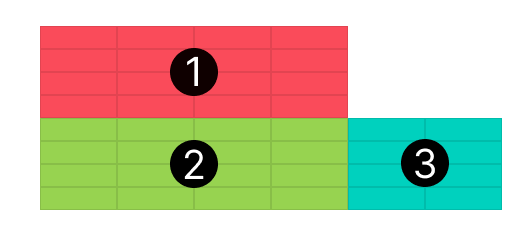

In [ ]:
entries_before = len(df)
entries_before

326

### Lets try some different method to confirm it

In [ ]:
df2 = df.iloc[:,:-4]
df2 = df2.drop_duplicates()

len(df2), entries_before, len(df2)*2

(163, 326, 326)

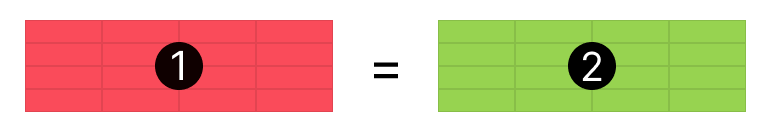

- It is true for all train and test files
- 50% of the data is useless
- if we fill NaN values with some values (mean, zero, etc.) -> misleading the model
- we will be only using the 2nd part of the data because it has values in the last 4 columns
- with 50% duplicate data dropped, we reduce time required for training the model

In [3]:
all_data = []
for file in os.listdir(train_path):
    file_path = os.path.join(train_path, file)
    present_df = pd.read_csv(file_path, header=None, names=cLabels, on_bad_lines='skip', na_values='?')

    # Calculate the start index for the second half of the dataframe
    start_idx = len(present_df) // 2

    # Select only the second half of the dataframe
    present_df = present_df.iloc[start_idx:]
    

    present_df['activity'] = file.split('_')[-1].split('.')[0]

    all_data.append(present_df)

all_data = pd.concat(all_data).reset_index(drop=True)
all_data

,NOSE_X,NOSE_Y,NOSE_C,NECK_X,NECK_Y,NECK_C,R_SHOULDER_X,R_SHOULDER_Y,R_SHOULDER_C,R_ELBOW_X,...,R_SMALL_TOE_Y,R_SMALL_TOE_C,R_HEEL_X,R_HEEL_Y,R_HEEL_C,R_ANGLE_ELBOW,R_ANGLE_ARMPIT,L_ANGLE_ELBOW,L_ANGLE_ARMPIT,activity
0,267.730682,117.018677,0.895402,279.800842,185.387146,0.895754,209.508896,199.382751,0.793637,183.428574,...,0.000000,0.0,0.000000,0.000000,0.0,2.357449,2.066650,0.665696,2.205961,rowing
1,267.000000,118.000000,1.000000,279.000000,186.000000,1.000000,209.000000,201.000000,1.000000,183.000000,...,-0.021049,0.0,-0.363440,-0.021049,0.0,2.472043,2.075479,0.607462,2.197049,rowing
2,266.000000,119.000000,1.000000,278.000000,187.000000,1.000000,209.000000,202.000000,1.000000,184.000000,...,0.001790,0.0,-0.182489,0.001790,0.0,2.568260,2.070908,0.540925,2.210766,rowing
3,265.000000,120.000000,1.000000,277.000000,188.000000,1.000000,209.000000,203.000000,1.000000,184.000000,...,0.006548,0.0,-0.118099,0.006548,0.0,2.677043,2.070808,0.330411,2.137982,rowing
4,265.000000,121.000000,1.000000,277.000000,189.000000,1.000000,210.000000,202.000000,1.000000,184.000000,...,0.012986,0.0,-0.110839,0.012986,0.0,2.756584,2.049726,0.153664,2.126956,rowing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326706,318.000000,108.000000,1.000000,314.000000,204.000000,1.000000,233.000000,206.000000,1.000000,203.000000,...,2.171539,0.0,-59.448929,2.171539,0.0,2.781696,1.820608,2.829406,1.917507,drums
326707,319.000000,109.000000,1.000000,314.000000,204.000000,1.000000,233.000000,206.000000,1.000000,202.000000,...,1.733391,0.0,-59.467880,1.733391,0.0,2.782785,1.827849,2.853521,1.901493,drums
326708,319.000000,109.000000,1.000000,314.000000,204.000000,1.000000,233.000000,206.000000,1.000000,201.000000,...,2.078156,0.0,-59.453873,2.078156,0.0,2.795961,1.826573,2.874588,1.887871,drums
326709,319.000000,109.000000,1.000000,314.000000,204.000000,1.000000,233.000000,206.000000,1.000000,200.000000,...,1.810852,0.0,-59.637039,1.810852,0.0,2.806507,1.833529,2.901664,1.863995,drums


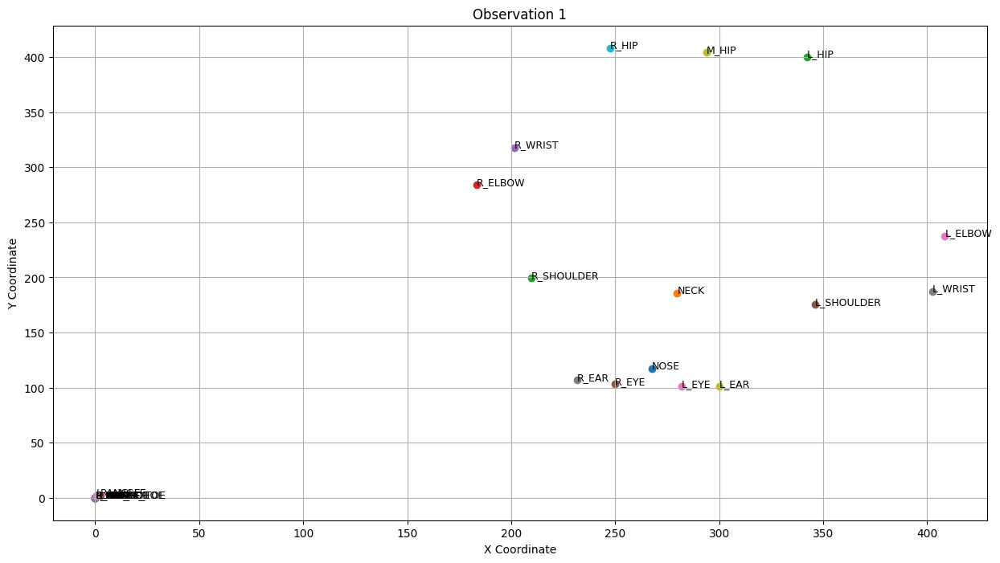

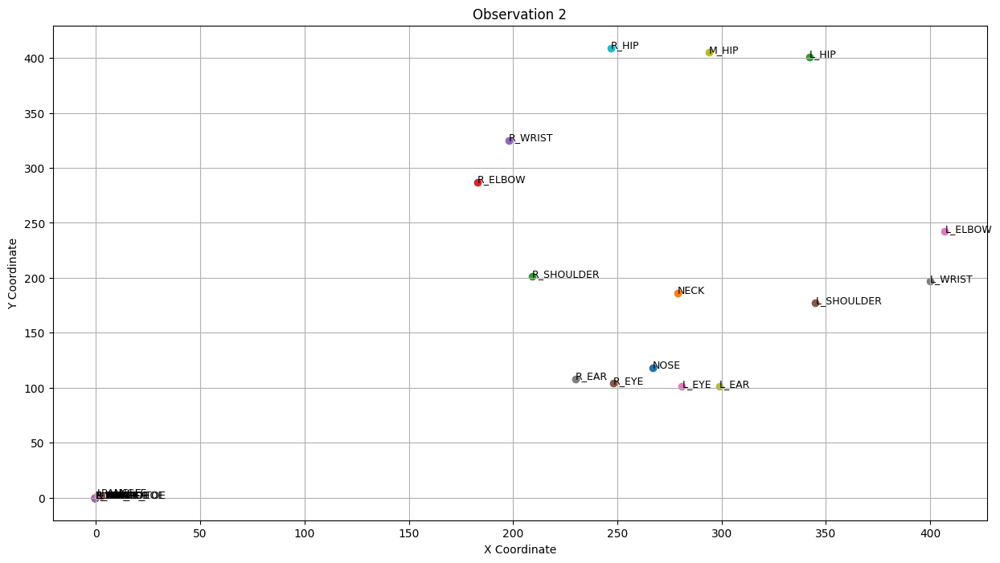

In [4]:
import matplotlib.pyplot as plt
import pandas as pd

Visual_data = all_data.head(2)

# Filter out columns with '_C' as they are confidence scores
coordinate_columns = [col for col in Visual_data.columns if not col.endswith('_C')]

for index, row in Visual_data.iterrows():
    plt.figure(figsize=(15, 8))

    num_columns = len(coordinate_columns)
    if num_columns % 2 != 0:
        num_columns -= 1

    # Plotting X and Y coordinates for each body joint
    for i in range(0, num_columns, 2):
        x = row[coordinate_columns[i]]
        y = row[coordinate_columns[i + 1]]
        plt.scatter(x, y)
        plt.text(x, y, coordinate_columns[i].rsplit('_', 1)[0], fontsize=9)

    plt.title(f'Observation {index + 1}')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.grid(True)
    plt.show()

In [5]:
all_data["label"] = all_data["activity"].map(activity_label)
all_data = all_data.drop(columns=['activity'])

In [6]:
all_data.columns

Index(['NOSE_X', 'NOSE_Y', 'NOSE_C', 'NECK_X', 'NECK_Y', 'NECK_C',
       'R_SHOULDER_X', 'R_SHOULDER_Y', 'R_SHOULDER_C', 'R_ELBOW_X',
       'R_ELBOW_Y', 'R_ELBOW_C', 'R_WRIST_X', 'R_WRIST_Y', 'R_WRIST_C',
       'L_SHOULDER_X', 'L_SHOULDER_Y', 'L_SHOULDER_C', 'L_ELBOW_X',
       'L_ELBOW_Y', 'L_ELBOW_C', 'L_WRIST_X', 'L_WRIST_Y', 'L_WRIST_C',
       'M_HIP_X', 'M_HIP_Y', 'M_HIP_C', 'R_HIP_X', 'R_HIP_Y', 'R_HIP_C',
       'R_KNEE_X', 'R_KNEE_Y', 'R_KNEE_C', 'R_ANKLE_X', 'R_ANKLE_Y',
       'R_ANKLE_C', 'L_HIP_X', 'L_HIP_Y', 'L_HIP_C', 'L_KNEE_X', 'L_KNEE_Y',
       'L_KNEE_C', 'L_ANKLE_X', 'L_ANKLE_Y', 'L_ANKLE_C', 'R_EYE_X', 'R_EYE_Y',
       'R_EYE_C', 'L_EYE_X', 'L_EYE_Y', 'L_EYE_C', 'R_EAR_X', 'R_EAR_Y',
       'R_EAR_C', 'L_EAR_X', 'L_EAR_Y', 'L_EAR_C', 'L_BIG_TOE_X',
       'L_BIG_TOE_Y', 'L_BIG_TOE_C', 'L_SMALL_TOE_X', 'L_SMALL_TOE_Y',
       'L_SMALL_TOE_C', 'L_HEEL_X', 'L_HEEL_Y', 'L_HEEL_C', 'R_BIG_TOE_X',
       'R_BIG_TOE_Y', 'R_BIG_TOE_C', 'R_SMALL_TOE_X', 'R_SMALL_TOE_Y'

In [7]:
train_data = all_data[[
    'NOSE_X', 'NOSE_Y', 'NECK_X', 'NECK_Y',
    'R_SHOULDER_X', 'R_SHOULDER_Y', 'R_ELBOW_X',
    'R_ELBOW_Y', 'R_WRIST_X', 'R_WRIST_Y',
    'L_SHOULDER_X', 'L_SHOULDER_Y', 'L_ELBOW_X',
    'L_ELBOW_Y', 'L_WRIST_X', 'L_WRIST_Y',
    'M_HIP_X', 'M_HIP_Y', 'R_HIP_X', 'R_HIP_Y',"label"
]]
train_data

,NOSE_X,NOSE_Y,NECK_X,NECK_Y,R_SHOULDER_X,R_SHOULDER_Y,R_ELBOW_X,R_ELBOW_Y,R_WRIST_X,R_WRIST_Y,...,L_SHOULDER_Y,L_ELBOW_X,L_ELBOW_Y,L_WRIST_X,L_WRIST_Y,M_HIP_X,M_HIP_Y,R_HIP_X,R_HIP_Y,label
0,267.730682,117.018677,279.800842,185.387146,209.508896,199.382751,183.428574,283.897736,201.405533,318.025116,...,175.345215,408.436584,237.664413,402.380341,187.340881,293.850189,404.397827,247.611557,408.358429,3
1,267.000000,118.000000,279.000000,186.000000,209.000000,201.000000,183.000000,287.000000,198.000000,325.000000,...,177.000000,407.000000,242.000000,400.000000,197.000000,294.000000,405.000000,247.000000,409.000000,3
2,266.000000,119.000000,278.000000,187.000000,209.000000,202.000000,184.000000,287.000000,197.000000,331.000000,...,180.000000,406.000000,248.000000,397.000000,205.000000,294.000000,405.000000,247.000000,409.000000,3
3,265.000000,120.000000,277.000000,188.000000,209.000000,203.000000,184.000000,289.000000,193.000000,338.000000,...,181.000000,406.000000,257.000000,393.000000,220.000000,293.000000,406.000000,247.000000,409.000000,3
4,265.000000,121.000000,277.000000,189.000000,210.000000,202.000000,184.000000,290.000000,189.000000,341.000000,...,183.000000,405.000000,264.000000,390.000000,236.000000,292.000000,407.000000,247.000000,409.000000,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326706,318.000000,108.000000,314.000000,204.000000,233.000000,206.000000,203.000000,337.000000,219.000000,455.000000,...,205.000000,439.000000,317.000000,442.000000,448.000000,320.000000,453.000000,267.000000,455.000000,1
326707,319.000000,109.000000,314.000000,204.000000,233.000000,206.000000,202.000000,337.000000,217.000000,455.000000,...,205.000000,437.000000,317.000000,441.000000,446.000000,320.000000,453.000000,267.000000,452.000000,1
326708,319.000000,109.000000,314.000000,204.000000,233.000000,206.000000,201.000000,342.000000,214.000000,455.000000,...,205.000000,435.000000,316.000000,440.000000,446.000000,320.000000,453.000000,267.000000,452.000000,1
326709,319.000000,109.000000,314.000000,204.000000,233.000000,206.000000,200.000000,342.000000,211.000000,455.000000,...,205.000000,435.000000,326.000000,440.000000,446.000000,320.000000,453.000000,267.000000,452.000000,1


# Which features to select from data?

In [ ]:
body_parts = ['L_EAR', 'R_EAR', 'R_EYE', 'L_EYE', 'NOSE', 'NECK', 'R_SHOULDER', 'R_ELBOW', 'R_WRIST', 'L_SHOULDER', 'L_ELBOW', 'L_WRIST', 'M_HIP', 'R_HIP', 'R_KNEE', 'R_ANKLE', 'L_HIP', 'L_KNEE', 'L_ANKLE', 'L_BIG_TOE', 'R_BIG_TOE', 'L_SMALL_TOE', 'R_SMALL_TOE', 'L_HEEL', 'R_HEEL']

connections = [
    ('NOSE', 'R_EYE'),
    ('NOSE', 'L_EYE'),
    ('R_EYE', 'R_EAR'),
    ('L_EYE', 'L_EAR'),
    ('NOSE', 'NECK'),
    ('NECK', 'R_SHOULDER'),
    ('R_SHOULDER', 'R_ELBOW'),
    ('R_ELBOW', 'R_WRIST'),
    ('NECK', 'L_SHOULDER'),
    ('L_SHOULDER', 'L_ELBOW'),
    ('L_ELBOW', 'L_WRIST'),
    ('NECK', 'M_HIP'),
    ('M_HIP', 'R_HIP'),
    ('R_HIP', 'R_KNEE'),
    ('R_KNEE', 'R_ANKLE'),
    ('M_HIP', 'L_HIP'),
    ('L_HIP', 'L_KNEE'),
    ('L_KNEE', 'L_ANKLE'),
    ('L_ANKLE', 'L_BIG_TOE'),
    ('L_BIG_TOE', 'L_SMALL_TOE'),
    ('L_ANKLE', 'L_HEEL'),
    ('R_ANKLE', 'R_BIG_TOE'),
    ('R_BIG_TOE', 'R_SMALL_TOE'),
    ('R_ANKLE', 'R_HEEL'),]

def create_connection(i):
    a = connections[i][0]
    b = connections[i][1]
    return a,b
create_connection(0)

('NOSE', 'R_EYE')

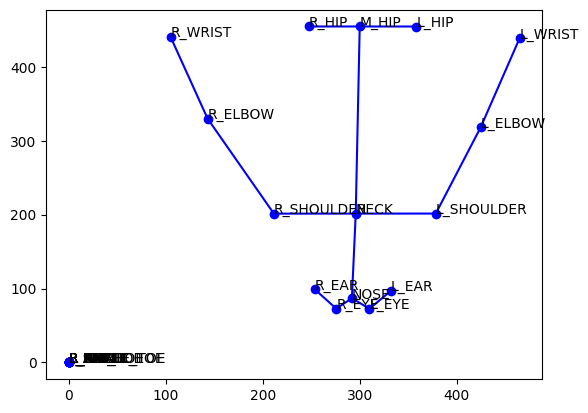

In [ ]:
skipped_parts = []
k = 0  # row value

for part in body_parts:
        if df[part+'_X'][k] <= 0 or df[part+'_Y'][k] <= 0:  # checking which points are outside the frame
            skipped_parts.append(part)
            # continue

        plt.plot(df[part+'_X'][k], df[part+'_Y'][k], 'bo')
        plt.text(df[part+'_X'][k], df[part+'_Y'][k], part)


for i in range(len(connections)):
        a, b = create_connection(i)

        if len(skipped_parts) > 0 and ((a in skipped_parts) or (b in skipped_parts)):  # ignoring connections for skipped parts
            continue
        plt.plot([df[a + '_X'][k], df[b + '_X'][k]], [df[a + '_Y'][k], df[b + '_Y'][k]], 'b-')

In [ ]:
print(skipped_parts)

['R_KNEE', 'R_ANKLE', 'L_KNEE', 'L_ANKLE', 'L_BIG_TOE', 'R_BIG_TOE', 'L_SMALL_TOE', 'R_SMALL_TOE', 'L_HEEL', 'R_HEEL']


#### Why are some points in the bottom corner? ['R_KNEE', 'R_ANKLE', ...]

#### Explaination:
- Values of these skeleton points has to be outsize the frame
- For the points outside frame, default value is set (0)

### What should we do now?
- Consider only points that are always in the frame (Upper body parts)

### Histograms for selected features

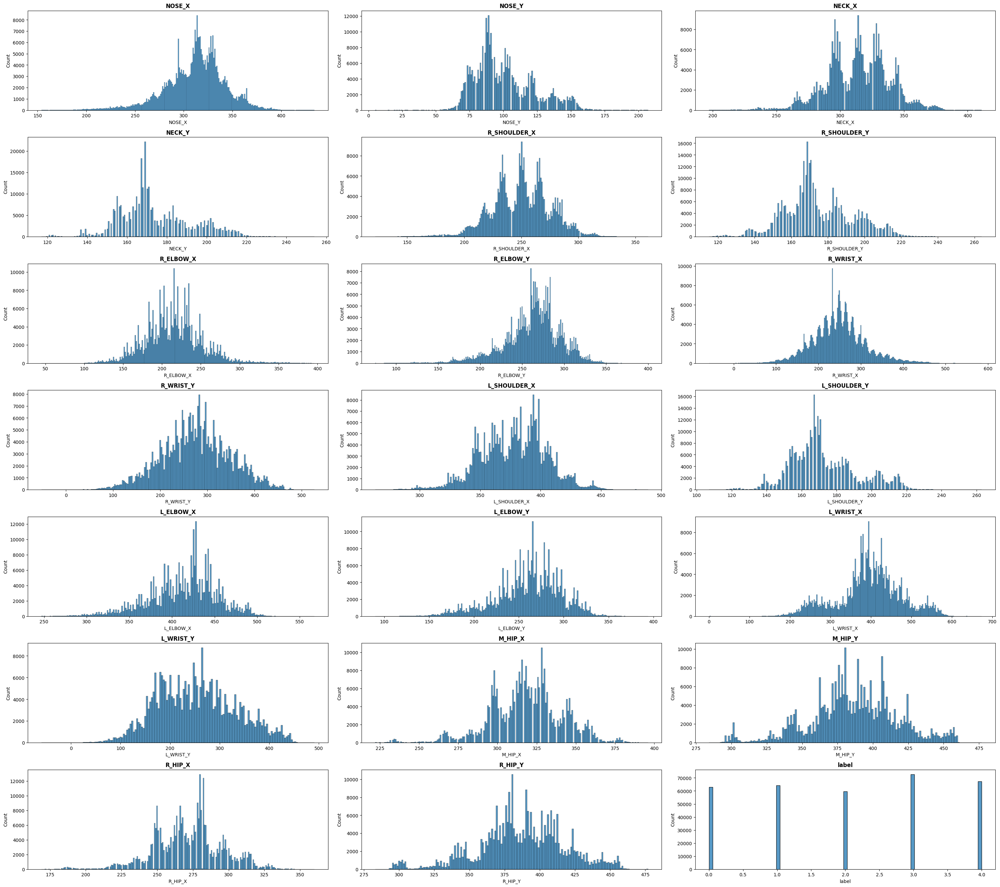

In [8]:
# Set up the matplotlib figure
plt.figure(figsize=(30, 30))

for i, column in enumerate(train_data.columns):
    plt.subplot(8, 3, i+1) 
    sns.histplot(train_data[column], kde=False)
    plt.title(column, fontweight='bold')
    plt.tight_layout()

plt.show()

### Animations:

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML

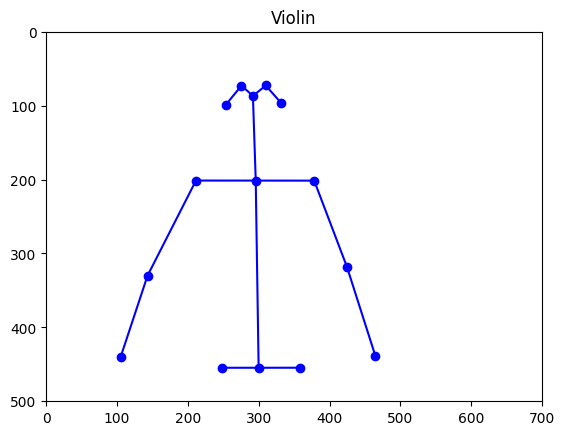

In [ ]:
def update(frame):
    plt.cla()  # Clear the previous plot
    plt.xlim(0, 700)
    plt.ylim(0, 500)
    plt.gca().invert_yaxis() # flips the graph upside down
    plt.title("Violin")
    skipped_parts = []

    for part in body_parts:
        if df[part+'_X'][frame] <= 0 or df[part+'_Y'][frame] <= 0:
            skipped_parts.append(part)
            continue

        plt.plot(df[part+'_X'][frame], df[part+'_Y'][frame], 'bo')  # color=df["color"][frame] # Plot each body part

    # Example: Connect the body parts to create the skeletal structure
    for i in range(len(connections)):
        a, b = create_connection(i)

        if len(skipped_parts) > 0 and ((a in skipped_parts) or (b in skipped_parts)):
            continue
        plt.plot([df[a + '_X'][frame], df[b + '_X'][frame]], [df[a + '_Y'][frame], df[b + '_Y'][frame]], 'b-') # color=df["color"][frame]



# # Create the animation
fig = plt.figure()

ani = animation.FuncAnimation(fig, update, frames=len(df), interval=60)  # Update the plot for each frame

HTML(ani.to_jshtml())

### Random Forest Model 

In [9]:
# Assigning the label as the target and the rest as features
features = train_data.iloc[:, :-1]  
target = train_data.iloc[:, -1]   

In [10]:
# Determine the split size
split_size = int(features.shape[0] * 0.75)

# Split the data without shuffling
X_train = features[:split_size]
y_train = target[:split_size]
X_val = features[split_size:]
y_val = target[split_size:]

In [11]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_val.shape)
print("y_test shape:", y_val.shape)

X_train shape: (245033, 20)
y_train shape: (245033,)
X_test shape: (81678, 20)
y_test shape: (81678,)


In [12]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Predict on the validation data
y_pred = random_forest.predict(X_val)

# Calculate the accuracy
accuracy = accuracy_score(y_val, y_pred)
print(f'Validation Accuracy: {accuracy}')

report = classification_report(y_val, y_pred)
print(report)

Validation Accuracy: 0.9678126300839883
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     13502
           1       0.97      0.95      0.96     17195
           2       0.99      0.97      0.98     16335
           3       0.96      0.98      0.97     18194
           4       0.98      0.96      0.97     16452

    accuracy                           0.97     81678
   macro avg       0.97      0.97      0.97     81678
weighted avg       0.97      0.97      0.97     81678



In [13]:
test_folder_path = r"C:\Semester 2\LSD\LSD_Portfolio_3\learning-of-structured-data-fhws-ws2324\test"
results = []

for filename in os.listdir(test_folder_path):
    if filename.endswith('.csv'):
        file_path = os.path.join(test_folder_path, filename)
        test_data = pd.read_csv(file_path, header=None, names=cLabels, on_bad_lines='skip', na_values='?')
        start_idx = len(test_data) // 2
        test_data = test_data.iloc[start_idx:]
        test_data = test_data[['NOSE_X', 'NOSE_Y', 'NECK_X', 'NECK_Y', 'R_SHOULDER_X', 'R_SHOULDER_Y', 'R_ELBOW_X', 'R_ELBOW_Y', 'R_WRIST_X', 'R_WRIST_Y', 'L_SHOULDER_X', 'L_SHOULDER_Y', 'L_ELBOW_X', 'L_ELBOW_Y', 'L_WRIST_X', 'L_WRIST_Y', 'M_HIP_X', 'M_HIP_Y', 'R_HIP_X', 'R_HIP_Y']]

        predictions = random_forest.predict(test_data)
        most_common_prediction = np.bincount(predictions).argmax()

        results.append({'id': filename.replace('.csv', ''), 'action': most_common_prediction})

results_df = pd.DataFrame(results)
results_df['id'] = pd.to_numeric(results_df['id'])
results_df = results_df.sort_values(by='id')
results_df

,id,action
0,0,0
1,1,3
112,2,4
223,3,3
239,4,4
...,...,...
225,300,0
226,301,0
227,302,4
228,303,0


In [14]:
# Save the results to a CSV file
results_df.to_csv('Random_Forest_test_preds.csv', index=False)

print("Predictions saved to 'Random_Forest_test_preds.csv'")

Predictions saved to 'Random_Forest_test_preds.csv'


For Random Forest, we are getting 63% accuarcy in Kaggle.

## LSTM

In [15]:
train_data = train_data.reset_index(drop=True)
train_data.columns

Index(['NOSE_X', 'NOSE_Y', 'NECK_X', 'NECK_Y', 'R_SHOULDER_X', 'R_SHOULDER_Y',
       'R_ELBOW_X', 'R_ELBOW_Y', 'R_WRIST_X', 'R_WRIST_Y', 'L_SHOULDER_X',
       'L_SHOULDER_Y', 'L_ELBOW_X', 'L_ELBOW_Y', 'L_WRIST_X', 'L_WRIST_Y',
       'M_HIP_X', 'M_HIP_Y', 'R_HIP_X', 'R_HIP_Y', 'label'],
      dtype='object')

In [16]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Separate features and target
X = train_data.drop('label', axis=1)
y = train_data['label']

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reshape input to be features
X_scaled = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)

# Determine the split size
split_size = int(X_scaled.shape[0] * 0.7)

# Split the data without shuffling
X_train = X_scaled[:split_size]
y_train = y[:split_size]
X_val = X_scaled[split_size:]
y_val = y[split_size:]

# Find out the number of unique classes
num_classes = len(np.unique(y_val))

# Build LSTM model with three 

model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1],X_train.shape[2])))
model.add(LSTM(50, activation='relu', return_sequences=True))  # Second LSTM layer
model.add(LSTM(50, activation='relu'))  # Third LSTM layer
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_val, y_val)
print(f'Test Accuracy: {test_accuracy}')




Epoch 1/5


7147/7147 [==============================] - 247s 33ms/step - loss: 0.6023 - accuracy: 0.7664 - val_loss: 0.3670 - val_accuracy: 0.8768
Epoch 2/5
7147/7147 [==============================] - 243s 34ms/step - loss: 0.1786 - accuracy: 0.9367 - val_loss: 0.3378 - val_accuracy: 0.9009
Epoch 3/5
7147/7147 [==============================] - 239s 33ms/step - loss: 0.1151 - accuracy: 0.9593 - val_loss: 0.2528 - val_accuracy: 0.9282
Epoch 4/5
7147/7147 [==============================] - 242s 34ms/step - loss: 0.0878 - accuracy: 0.9693 - val_loss: 0.2288 - val_accuracy: 0.9368
Epoch 5/5
3063/3063 [==============================] - 41s 13ms/step - loss: 0.2667 - accuracy: 0.9318
Test Accuracy: 0.9317954778671265


In [17]:
from tensorflow.keras.models import load_model
from sklearn.preprocessing import StandardScaler

# Path to the test folder
test_folder_path = r"C:\Semester 2\LSD\LSD_Portfolio_3\learning-of-structured-data-fhws-ws2324\test"

# Prepare a list to store the results
results = []


# Iterate over each file in the test folder
for filename in os.listdir(test_folder_path):
    if filename.endswith('.csv'):
        # Read the test data from CSV file
        file_path = os.path.join(test_folder_path, filename)
        test_data = pd.read_csv(file_path, header=None, names=cLabels, on_bad_lines='skip', na_values='?')
        # Calculate the start index for the second half of the dataframe
        start_idx = len(test_data) // 2
        # Select only the second half of the dataframe
        test_data = test_data.iloc[start_idx:]       
        test_data = test_data[[
    'NOSE_X', 'NOSE_Y', 'NECK_X', 'NECK_Y',
    'R_SHOULDER_X', 'R_SHOULDER_Y', 'R_ELBOW_X',
    'R_ELBOW_Y', 'R_WRIST_X', 'R_WRIST_Y',
    'L_SHOULDER_X', 'L_SHOULDER_Y', 'L_ELBOW_X',
    'L_ELBOW_Y', 'L_WRIST_X', 'L_WRIST_Y',
    'M_HIP_X', 'M_HIP_Y', 'R_HIP_X', 'R_HIP_Y',
]]

        # Normalize features (using the same scaler parameters as your training data)
        test_data_scaled = scaler.transform(test_data)
        test_data_scaled = test_data_scaled.reshape(test_data_scaled.shape[0], test_data_scaled.shape[1], 1)

        # Predict for each row in the test data
        predictions = model.predict(test_data_scaled, verbose = 0)

        # Find the most common prediction (highest predicted action)
        predictions = np.argmax(predictions, axis=1)
        predictions = np.bincount(predictions).argmax()

        # Store the result with the file name (without .csv) as Activity ID
        results.append({'id': filename.replace('.csv', ''), 'action': predictions})

# Convert the results to a DataFrame
results_df = pd.DataFrame(results)
results_df['id'] = pd.to_numeric(results_df['id'])
results_df = results_df.sort_values(by='id')
results_df

,id,action
0,0,0
1,1,3
112,2,3
223,3,3
239,4,3
...,...,...
225,300,0
226,301,2
227,302,4
228,303,0


In [18]:
# Save the results to a CSV file
results_df.to_csv('LSTM.csv', index=False)

print("Predictions saved to 'lstm_test_predictions.csv'")

Predictions saved to 'lstm_test_predictions.csv'


For LSTM, We are getting 74 % Accuracy in Kaggle.

### Deep GRU with Atention Mechanism But in Pytorch

<img src="DeepGRU.png" width="400"/> <!-- Adjust the width as needed -->


In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset,TensorDataset, SubsetRandomSampler, SequentialSampler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from collections import Counter
import matplotlib.pyplot as plt
from torch.nn.utils.rnn import pack_padded_sequence as packer, pad_packed_sequence as padder , pad_sequence
from torchmetrics import Accuracy, Precision, Recall, F1Score

In [3]:
#Read Data
def read_train_dataset(file_path,columns = cLabels,act_dictionary = activity_label):

    files = os.listdir(file_path)
    files = [file for file in files if file.endswith('csv')]

    data = []
    files_idx = []
    activities = []

    for idx,file in enumerate(files):
        act = file.split('_')[1].split('.')[0]
        fl = file.split('_')[0]
        df = pd.read_csv(os.path.join(file_path,file),header=None,names=columns,on_bad_lines='skip',na_values='?')
        df = df.dropna()
        
        if act not in activities:
            activities.append(act)

        if fl not in files_idx:
            files_idx.append(fl)

        enc_act = act_dictionary[act]
        enc_fl = files_idx.index(fl)
        df['act_enc'] = enc_act
        df['activity'] = act
        df['fl_num'] = fl
        df['fl_enc'] = enc_fl
        df = df.fillna(0)

        data.append(df)

    train_data = pd.concat(data)
    return train_data

In [4]:
# Dataset and Data Preprepocessing
class MyDataset(Dataset):
    def __init__(self,data,labels):
        # Your dataset initialization code here
        self.data = data
        self.labels = labels

    def __getitem__(self, index):
        # Your code to load and return a sample from the dataset
        i_start,i_end = index
        data = self.data[i_start:i_end]
        label = self.labels[i_start]
        # print(f'd-shape: {data.shape} l-shape {label.shape}')
        return data,label

    def __len__(self):
        # Return the total number of samples in the dataset
        # print('len')
        return len(self.data)
    
# Define a collate function to pad sequences
def collate_fn(batch):
    # sorted_batch = sorted(batch, key=lambda x: x[0].shape[0], reverse=True)
    sorted_batch = batch
    # print(sorted_batch)
    data = [x[0] for x in sorted_batch]
    labels = [x[1] for x in sorted_batch]
    labels = torch.stack(labels).long()
    # Pad sequences to the length of the longest sequence in the batch
    padded_data = pad_sequence(data, batch_first=True, padding_value=0)
    return padded_data , labels

In [5]:
def get_indexes(data_frame,min_sequence=150,column_file = 'fl_enc'):

    x_index = []
    x_min = min_sequence

    files = data_frame[column_file].unique().tolist()
    train_tensor = torch.tensor(data_frame.values, dtype=torch.float32)

    for idx, file in enumerate(files):
        condition = train_tensor[:,-1] == file
        train_df_idx = train_tensor[train_tensor[:,-1] == file]
        rows_idx = train_df_idx.shape[0]

        # Find the indices where the condition is True
        indices = torch.nonzero(condition, as_tuple=False)

        first_index = indices[0, 0].item()
        max_index = first_index + rows_idx - x_min
        last_index = first_index + rows_idx

        for y in range(first_index,max_index):
            l_index = min(y + 200, last_index)
            x_index.append([y,l_index])

    return x_index

In [6]:
# Paths
path_data = 'data/'
path_train = path_data+'train/'

# Read Train Dataset
train_data = read_train_dataset(path_train)

columns_to_keep = [col for col in train_data.columns if '_C' not in col]
# train_data = train_data[columns_to_keep]
train_data = train_data[imp_cls + ['act_enc', 'activity', 'fl_num', 'fl_enc']]

# Preprocessing 
# Define Scaler
scaler = StandardScaler()

# Assuming you have your sequences and labels
X =  train_data[imp_cls]
X = scaler.fit_transform(X)
Y = train_data['act_enc']

# Tensor for defining training set
X_file = train_data.iloc[:, list(range(20)) + [20] + [-1]]

# Defining Train-Test split
files_train = X_file['fl_enc'].unique()

# Split the unique values into train and test sets
# Adjust the test_size parameter to control the ratio of the split
train_indices, test_indices = train_test_split(files_train, test_size=0.2, random_state=42)

# Filter the original DataFrame based on the train and test values
train_df = X_file[X_file['fl_enc'].isin(train_indices)]
test_df = X_file[X_file['fl_enc'].isin(test_indices)]

train_indices = get_indexes(train_df)
test_indices = get_indexes(test_df)

X_train =  torch.tensor(scaler.transform(train_df.iloc[:, :20]), dtype=torch.float32)
X_test = torch.tensor(scaler.transform(test_df.iloc[:, :20]), dtype=torch.float32)
y_train = torch.tensor(train_df['act_enc'].values, dtype=torch.float32)
y_test = torch.tensor(test_df['act_enc'].values, dtype=torch.float32)


In [9]:
# Deep GRU #
    
class DeepGRU(nn.Module):
    def __init__(self, num_features, num_classes):
        super(DeepGRU, self).__init__()
        self.num_features = num_features
        self.num_classes = num_classes

        # Encoder
        self.gru1 = nn.GRU(self.num_features, 512, 2, batch_first=True)
        self.gru2 = nn.GRU(512, 256, 2, batch_first=True)
        self.gru3 = nn.GRU(256, 128, 1, batch_first=True)

        # Attention
        self.attention = Attention(128)

        # Classifier
        self.classifier = nn.Sequential(
            nn.BatchNorm1d(256),
            nn.Dropout(0.5),
            nn.Linear(256, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x_packed = x

        # Encode
        output, _ = self.gru1(x_packed)
        output, _ = self.gru2(output)
        output, hidden = self.gru3(output)

        # Pass to attention with the original padding
        # output_padded, _ = padder(output, batch_first=True)
        attn_output = self.attention(output, hidden[-1:])

        # Classify
        return self.classifier(attn_output)

    def get_num_params(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

# ----------------------------------------------------------------------------------------------------------------------
class Attention(nn.Module):
    def __init__(self, attention_dim):
        super(Attention, self).__init__()
        self.w = nn.Linear(attention_dim, attention_dim, bias=False)
        self.gru = nn.GRU(128, 128, 1, batch_first=True)

    def forward(self, input_padded, hidden):
        e = torch.bmm(self.w(input_padded), hidden.permute(1, 2, 0))
        context = torch.bmm(input_padded.permute(0, 2, 1), e.softmax(dim=1))
        context = context.permute(0, 2, 1)

        # Compute the auxiliary context, and concat
        aux_context, _ = self.gru(context, hidden)
        output = torch.cat([aux_context, context], 2).squeeze(1)

        return output

In [10]:
# Training

# Parameters
input_size = 20
num_classes = 5
bs = 32
num_epochs = 5
model_path = 'deep_gru_200sq_50.pth'


# Create an instance of the model
model = DeepGRU(num_features = input_size, num_classes = num_classes)

if os.path.exists(model_path):
    state_dict = torch.load(model_path)
    model.load_state_dict(state_dict)


# Datasets
train_ds = MyDataset(X_train,y_train)
test_ds = MyDataset(X_test,y_test)

# Create a SubsetRandomSampler using the selected indices
train_sampler = SubsetRandomSampler(train_indices)
test_sampler = SubsetRandomSampler(test_indices)

# Create a DataLoader using your dataset and the custom sampler
train_dl = DataLoader(train_ds, batch_size=bs, sampler=train_sampler,collate_fn = collate_fn)
test_dl = DataLoader(test_ds, batch_size=bs, sampler=test_sampler,collate_fn = collate_fn)


# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

progress_print_interval = len(train_dl) // 10
batches_count = len(train_dl)

print(f'Training GRU Epochs {num_epochs} batch_size {bs} input_size {input_size} classes {num_classes}')

for epoch in range(num_epochs):
    
    model.train()
    print(f'\nEpoch: {epoch+1}')
    for idx,(data,labels) in enumerate(train_dl):
        inputs = data  # Modify this based on your dataset structure
        optimizer.zero_grad()
        
        outputs = model(inputs)
        # print(f'inputs {inputs.shape} outputs {outputs.shape}')

        loss = criterion(outputs, labels)
        
        loss.backward()
        optimizer.step()

        progress_percentage = round(((idx + 1) / batches_count) * 100,1)
        if idx % progress_print_interval == 0:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Batch [{idx + 1}/{batches_count}], Loss: {loss.item():.4f}, Progress: {progress_percentage:.1f}%')


    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

    # Set the model to evaluation mode
    model.eval()
    # Disable gradient calculation during testing
    with torch.no_grad():

        # Initialize metrics
        accuracy = Accuracy(num_classes = 5, task='multiclass')
        precision = Precision(num_classes = 5, task='multiclass',average='macro')
        recall = Recall(task="multiclass", average='macro', num_classes=5)
        f1 = F1Score(num_classes = 5,task="multiclass")

        total_test_loss = 0.0
        num_batches = 0

        # Iterate through batches in the test data loader
        for test_batch,test_labels in test_dl:
            test_input_data = test_batch  # replace with actual data extraction logic

            # Forward pass on the test batch
            test_output_data = model(test_input_data)

            # Compute the test loss for this batch
            test_loss = criterion(test_output_data, test_labels)

            # Accumulate the total test loss
            total_test_loss += test_loss.item()
            num_batches += 1

            # Update your metric values for each batch
            accuracy.update(test_output_data, test_labels)
            precision.update(test_output_data, test_labels)
            recall.update(test_output_data, test_labels)
            f1.update(test_output_data, test_labels)

        # Calculate the average test loss across all batches
        average_test_loss = total_test_loss / num_batches

        # Print test statistics
        print(f'Average Test Loss: {average_test_loss:.4f}')
        # Compute and print final metrics
        final_accuracy = accuracy.compute()
        final_precision = precision.compute()
        final_recall = recall.compute()
        final_f1 = f1.compute()

        print(f"Final Accuracy: {final_accuracy}")
        print(f"Final Precision: {final_precision}")
        print(f"Final Recall: {final_recall}")
        print(f"Final F1 Score: {final_f1}")

# Save the trained model if needed
torch.save(model.state_dict(), model_path)


Training GRU Epochs 5 batch_size 128 input_size 20 classes 5

Epoch: 1
Epoch [1/5], Batch [1/957], Loss: 1.8179, Progress: 0.1%
Epoch [1/5], Batch [96/957], Loss: 0.0273, Progress: 10.0%
Epoch [1/5], Batch [191/957], Loss: 0.0282, Progress: 20.0%
Epoch [1/5], Batch [286/957], Loss: 0.1152, Progress: 29.9%
Epoch [1/5], Batch [381/957], Loss: 0.0025, Progress: 39.8%
Epoch [1/5], Batch [476/957], Loss: 0.0884, Progress: 49.7%
Epoch [1/5], Batch [571/957], Loss: 0.0287, Progress: 59.7%
Epoch [1/5], Batch [666/957], Loss: 0.0010, Progress: 69.6%
Epoch [1/5], Batch [761/957], Loss: 0.0017, Progress: 79.5%
Epoch [1/5], Batch [856/957], Loss: 0.0013, Progress: 89.4%
Epoch [1/5], Batch [951/957], Loss: 0.0002, Progress: 99.4%
Epoch [1/5], Loss: 0.0023
Average Test Loss: 0.0447
Final Accuracy: 0.9907571077346802
Final Precision: 0.9886212348937988
Final Recall: 0.9922967553138733
Final F1 Score: 0.9907571077346802

Epoch: 2
Epoch [2/5], Batch [1/957], Loss: 0.0006, Progress: 0.1%
Epoch [2/5], Ba

### Predict result

In [11]:
# Parameters
input_size = 20
num_classes = 5
bs = 32
path_Data = "data/"
path_test = path_data+'test/'
x_min = 90

# # Create an instance of the model
model = DeepGRU(num_features = input_size, num_classes = num_classes)

state_dict = torch.load(model_path)
model.load_state_dict(state_dict)

# Prepare a list to store the results
results = []

files_test = os.listdir(path_test)
progress_print_interval = len(files_test) // 8
# Iterate over each file in the test folder
for idx,filename in enumerate(files_test):
    if filename.endswith('.csv'):
        # Read the test data from CSV file
        file_path = os.path.join(path_test, filename)
        test_data = pd.read_csv(file_path, header=None, names=cLabels,on_bad_lines='skip', na_values='?')
        test_data = test_data.dropna()
        columns_to_keep = [col for col in test_data.columns if '_C' not in col]
        test_data = test_data[columns_to_keep]
        test_data = test_data[imp_cls]
        test_scaled_data = scaler.transform(test_data)
        test_scaled_data = torch.tensor(test_scaled_data, dtype=torch.float32)
        rows_t = test_scaled_data.shape[0]
        
        x_index = []
        max_index = rows_t - x_min
        for y in range(0,max_index):
            l_index = min(y + 200,rows_t)
            x_index.append([y,l_index])
        # print(f'indexes {x_index}')
        fake_labels = torch.tensor(test_data.iloc[:, -1].values)
        
        # Predict for each row in the test data

        Test_ds_eval = MyDataset(test_scaled_data,fake_labels)
        test_sampler = SubsetRandomSampler(x_index)

        # Create a DataLoader using your dataset and the custom sampler
        test_dl = DataLoader(Test_ds_eval, batch_size=bs, sampler=test_sampler,collate_fn = collate_fn)

        model.eval()

        rows = []
        preds = []

        with torch.no_grad():
            # Assuming test_loader is your DataLoader for test data
            for batch_idx, data in enumerate(test_dl):
                # Forward pass (no optimization)
#                 print(data)
                dx,flabel = data
                output_data = model(dx)
                predictions = torch.argmax(output_data, dim=1)
                preds.append(predictions)
#                 print(f"batch idx: {batch_idx}\noutput data: {output_data}")

            # Use Counter to count the occurrences of each class index
            
            preds = torch.cat(preds)
            counter = Counter(preds.tolist())

            # Find the most common class index
            
            most_common_class_index = counter.most_common(1)[0][0]
            # print(f'Class {most_common_class_index}')

            # Store the result with the file name (without .csv) as Activity ID
            results.append({'id': filename.replace('.csv', ''), 'action': most_common_class_index})
    if idx % progress_print_interval == 0:
        print(f'Progress: {100*idx/len(files_test):.1f}%')

# Convert the results to a DataFrame
results_df = pd.DataFrame(results)

# Save the results to a CSV file
results_df.to_csv('gru_20x_128.csv', index=False)


Progress: 0.0%
Progress: 12.5%
Progress: 24.9%
Progress: 37.4%
Progress: 49.8%
Progress: 62.3%
Progress: 74.8%
Progress: 87.2%
Progress: 99.7%


**For Deep Gru, We are getting 86.854% in kaggle**

### Memory and Runtime Complexity Analysis For DEEP GRU

#### Network Architecture:
- **Input Size:** `num_features`
- **Output Classes:** `num_classes`
- **GRU Layers:**
  - GRU1: Input size = `num_features`, Output size = 512, 2 layers
  - GRU2: Input size = 512, Output size = 256, 2 layers
  - GRU3: Input size = 256, Output size = 128, 1 layer
- **Attention Mechanism:** Operating on 128-dimensional vectors
- **Classifier:** Linear layers with 256 units

#### Memory Complexity:

**Parameters in GRU Layers:**
1. GRU1: $\approx 3 \times (num\_features \times 512 + 512^2)$ parameters per layer $\times$ 2 layers
2. GRU2: $\approx 3 \times (512 \times 256 + 256^2)$ parameters per layer $\times$ 2 layers
3. GRU3: $\approx 3 \times (256 \times 128 + 128^2)$ parameters per layer $\times$ 1 layer

**Parameters in Attention and Classifier:**
- Attention: Depends on the implementation of the attention mechanism but typically involves a weighted sum of the input features.
- Classifier: Layers of 256 units each with parameters and biases.

**Batch Size:**
- Given a batch size (e.g., 128), the memory requirement scales linearly with it.

#### Runtime Complexity:

**Training:**
- Each GRU layer's runtime complexity is $O(T \times H^2)$ per instance, where $T$ is the sequence length, and $H$ is the number of hidden units.
- Attention and classifier layers add additional but generally lower computational complexity compared to GRU layers.

**Testing:**
- Involves only forward passes, typically less computationally intensive than training.

#### Model Sparsity:
- If dropout or other regularization methods are used, they can induce sparsity in the model, potentially leading to more efficient computation and memory usage.
- Here we are using dropout, this led to efficient computations.

#### Notes:
- The exact memory and runtime complexity can vary based on the underlying hardware and optimization strategies used in training.
- The number of parameters and runtime can increase significantly with the size of the model (number of layers and units per layer).
- Efficient memory management (like gradient checkpointing) and parallel processing can mitigate some of the computational challenges.


#### Concluison:

- Deep GRU accuracy - 86.8%

- LSTM - 73%

- Random forest model - 62%



- We remove duplicates (50% of the data)
- Reduced time for training (13 hrs -> 5 hrs)
- Select features that are always in the frame

**The Deep GRU model, trained on 20 selected features, demonstrates superior performance compared to the Random Forest and LSTM models for the given activities. This suggests that Deep GRU's architecture is more effective in capturing the complexities and patterns within the limited feature set.**



# Kaggle Scores:
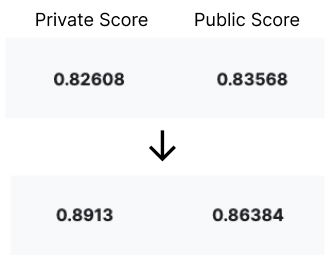

#### References:

1. [Deep_GRU_paper](https://arxiv.org/abs/1810.12514)
2. [Pose Estimation](https://paperswithcode.com/task/pose-estimation)
3. [LSTM_Model](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM)
4. [GRU notes](https://notes.dipta007.com/zettelkasten/gru/)

#### Team members: Group 9

**1. Rodolfo Cacacho Estrada**

**2. Dharana Dharana**

**3. Tharun Kumar Korine Palli**

**4. Pratik Nichite**

**5. Sharik Anwar Zahir Hussain**

# <center>THE END</center>